In [1]:
import arviz as az
import matplotlib.pyplot as plt
import numpyro
import pandas as pd

from vaxflux import (
    CovariateCategories,
    LogisticCurve,
    PartiallyPooledGaussianCovariate,
    SeasonRange,
    SeasonVaryingPartiallyPooledGaussianCovariate,
    VaxfluxModel,
)
from vaxflux.data import get_ncird_nis_frvm_flu_vaccination_coverage

numpyro.set_host_device_count(8)
az.style.use("arviz-docgrid")

In [2]:
observations = get_ncird_nis_frvm_flu_vaccination_coverage(include_age_groups=True)
observations.head()

,season,season_start_date,season_end_date,start_date,end_date,report_date,age,type,value
0,2021/22,2021-08-01,2022-03-31,2021-08-01,2021-10-30,2021-10-30,18-49 years,incidence,0.170
1,2021/22,2021-08-01,2022-03-31,2021-10-30,2021-11-27,2021-11-27,18-49 years,incidence,0.109
2,2021/22,2021-08-01,2022-03-31,2021-11-27,2021-12-31,2021-12-31,18-49 years,incidence,0.043
3,2021/22,2021-08-01,2022-03-31,2021-12-31,2022-01-29,2022-01-29,18-49 years,incidence,0.024
4,2021/22,2021-08-01,2022-03-31,2022-01-29,2022-02-26,2022-02-26,18-49 years,incidence,0.004


In [3]:
observations.groupby(["season", "age"], as_index=False)["value"].sum()

,season,age,value
0,2021/22,18-49 years,0.363
1,2021/22,50-64 years,0.488
2,2021/22,65+ years,0.655
3,2022/23,18-49 years,0.358
4,2022/23,50-64 years,0.503
5,2022/23,65+ years,0.684
6,2023/24,18-49 years,0.366
7,2023/24,50-64 years,0.502
8,2023/24,65+ years,0.715
9,2024/25,18-49 years,0.363


/var/folders/2z/h3pc0p7s3ng1tvxrgsw5kr680000gp/T/ipykernel_81445/4040012318.py:28: UserWarning: The figure layout has changed to tight
  fig.tight_layout(rect=(0, 0, 0.85, 1))


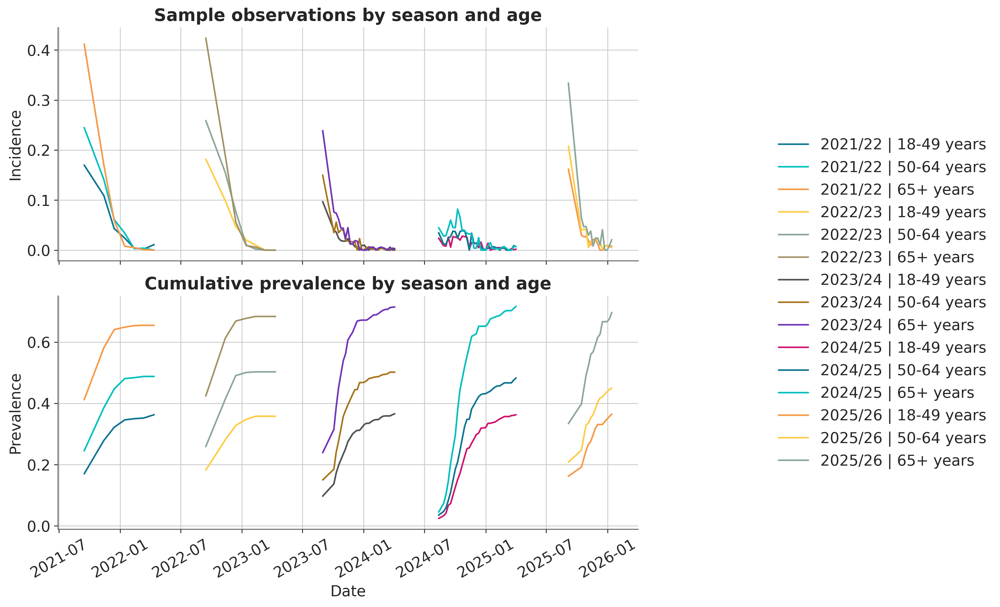

In [4]:
plot_data = observations.copy()
plot_data["start_date"] = pd.to_datetime(plot_data["start_date"])
plot_data["end_date"] = pd.to_datetime(plot_data["end_date"])
plot_data["mid_date"] = (
    plot_data["start_date"] + (plot_data["end_date"] - plot_data["start_date"]) / 2
)
plot_data = plot_data.sort_values("mid_date")
plot_data["prevalence"] = plot_data.groupby(["season", "age"])["value"].cumsum()

fig, (ax_inc, ax_prev) = plt.subplots(2, 1, figsize=(10, 8), sharex=True)

for (season, age), group in plot_data.groupby(["season", "age"]):
    label = f"{season} | {age}"
    ax_inc.plot(group["mid_date"], group["value"], label=label)
    ax_prev.plot(group["mid_date"], group["prevalence"], label=label)

ax_inc.set_title("Sample observations by season and age")
ax_inc.set_ylabel("Incidence")

ax_prev.set_title("Cumulative prevalence by season and age")
ax_prev.set_ylabel("Prevalence")
ax_prev.set_xlabel("Date")

handles, labels = ax_inc.get_legend_handles_labels()
fig.legend(handles, labels, loc="center left", bbox_to_anchor=(1.0, 0.5))
for label in ax_prev.get_xticklabels():
    label.set_rotation(30)
fig.tight_layout(rect=(0, 0, 0.85, 1))
plt.show()

In [5]:
season_bounds = (
    observations.groupby("season", as_index=False)
    .agg(
        season_start_date=("season_start_date", "min"),
        season_end_date=("season_end_date", "max"),
    )
    .sort_values("season")
)
seasons = [
    SeasonRange(
        season=row.season,
        start_date=row.season_start_date.date(),
        end_date=row.season_end_date.date(),
    )
    for row in season_bounds.itertuples(index=False)
]

age_covariate_categories = CovariateCategories(
    covariate="age",
    categories=tuple(observations["age"].drop_duplicates().tolist()),
)

In [6]:
covariates = [
    PartiallyPooledGaussianCovariate(
        parameter="m",
        covariate=None,
        mu_mu=-0.5,
        mu_sigma=0.5,
        sigma=0.5,
    ),
    PartiallyPooledGaussianCovariate(
        parameter="r",
        covariate=None,
        mu_mu=-3.5,
        mu_sigma=0.5,
        sigma=0.5,
    ),
    PartiallyPooledGaussianCovariate(
        parameter="s",
        covariate=None,
        mu_mu=60.0,
        mu_sigma=10.0,
        sigma=10.0,
    ),
    SeasonVaryingPartiallyPooledGaussianCovariate(
        parameter="m",
        covariate="age",
        mu_mu=1.5,
        mu_sigma=0.5,
        sigma=0.5,
    ),
    SeasonVaryingPartiallyPooledGaussianCovariate(
        parameter="r",
        covariate="age",
        mu_mu=0.5,
        mu_sigma=0.5,
        sigma=0.5,
    ),
    SeasonVaryingPartiallyPooledGaussianCovariate(
        parameter="s",
        covariate="age",
        mu_mu=0.0,
        mu_sigma=10.0,
        sigma=10.0,
    ),
]

In [7]:
curve = LogisticCurve()
curve

In [8]:
model = (
    VaxfluxModel(curve=curve)
    .add_seasons(seasons)
    .add_covariate_categories(age_covariate_categories)
    .add_covariates(covariates)
    .add_observations(observations)
    .add_observation_process(
        kind="normal",
        noise=0.01,
    )
)
model

In [9]:
prior_samples = 500
vaxflux_prior_idata = model.sample(samples=None, prior_samples=prior_samples)
vaxflux_prior_idata

Inference data with groups:
	> prior

In [10]:
vaxflux_prior_idata.prior_observations

,chain,draw,season,season_start_date,season_end_date,start_date,end_date,report_date,age,type,value
0,0,0,2021/22,2021-08-01,2022-03-31,2021-08-01,2021-10-30,2021-10-30,18-49 years,incidence,0.122936
1,0,0,2021/22,2021-08-01,2022-03-31,2021-10-30,2021-11-27,2021-11-27,18-49 years,incidence,0.040334
2,0,0,2021/22,2021-08-01,2022-03-31,2021-11-27,2021-12-31,2021-12-31,18-49 years,incidence,0.033967
3,0,0,2021/22,2021-08-01,2022-03-31,2021-12-31,2022-01-29,2022-01-29,18-49 years,incidence,0.017063
4,0,0,2021/22,2021-08-01,2022-03-31,2022-01-29,2022-02-26,2022-02-26,18-49 years,incidence,0.009292
...,...,...,...,...,...,...,...,...,...,...,...
134995,0,499,2025/26,2025-08-01,2026-03-31,2025-12-13,2025-12-20,2025-12-20,65+ years,incidence,0.009345
134996,0,499,2025/26,2025-08-01,2026-03-31,2025-12-20,2025-12-27,2025-12-27,65+ years,incidence,0.008084
134997,0,499,2025/26,2025-08-01,2026-03-31,2025-12-27,2026-01-03,2026-01-03,65+ years,incidence,0.006969
134998,0,499,2025/26,2025-08-01,2026-03-31,2026-01-03,2026-01-10,2026-01-10,65+ years,incidence,0.005989


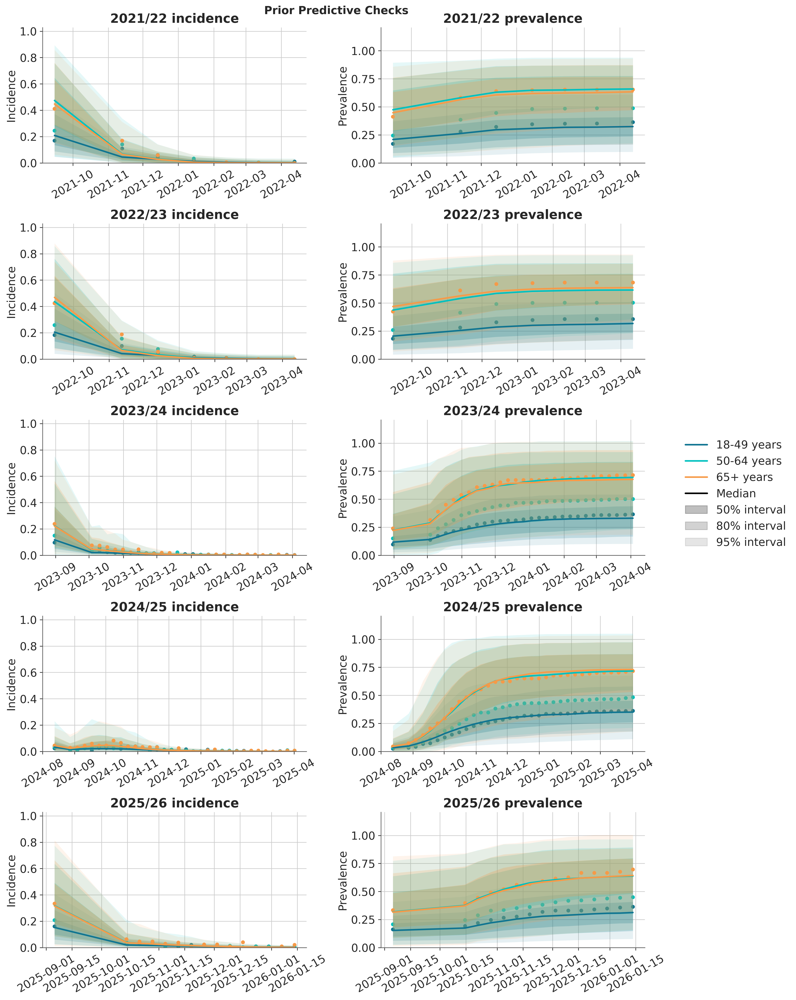

In [11]:
vaxflux_prior_idata.plot_prior_predictive()
plt.show()

In [12]:
warmup = 500
samples = 500
chains = 4
vaxflux_idata = model.sample(
    warmup=warmup, samples=samples, prior_samples=None, chains=chains
)
vaxflux_idata

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Inference data with groups:
	> posterior
	> posterior_predictive
	> sample_stats

In [13]:
vaxflux_idata.posterior_observations

,chain,draw,season,season_start_date,season_end_date,start_date,end_date,report_date,age,type,value
0,0,0,2021/22,2021-08-01,2022-03-31,2022-03-26,2022-04-30,2022-04-30,18-49 years,incidence,0.000259
1,0,0,2021/22,2021-08-01,2022-03-31,2021-08-01,2021-10-30,2021-10-30,18-49 years,incidence,0.180078
2,0,0,2021/22,2021-08-01,2022-03-31,2021-11-27,2021-12-31,2021-12-31,18-49 years,incidence,0.057738
3,0,0,2021/22,2021-08-01,2022-03-31,2022-01-29,2022-02-26,2022-02-26,18-49 years,incidence,0.003404
4,0,0,2021/22,2021-08-01,2022-03-31,2022-02-26,2022-03-26,2022-03-26,18-49 years,incidence,0.000902
...,...,...,...,...,...,...,...,...,...,...,...
539995,3,499,2025/26,2025-08-01,2026-03-31,2025-12-13,2025-12-20,2025-12-20,65+ years,incidence,0.011102
539996,3,499,2025/26,2025-08-01,2026-03-31,2025-11-15,2025-11-22,2025-11-22,65+ years,incidence,0.029905
539997,3,499,2025/26,2025-08-01,2026-03-31,2025-12-06,2025-12-13,2025-12-13,65+ years,incidence,0.014518
539998,3,499,2025/26,2025-08-01,2026-03-31,2025-11-22,2025-11-29,2025-11-29,65+ years,incidence,0.023913


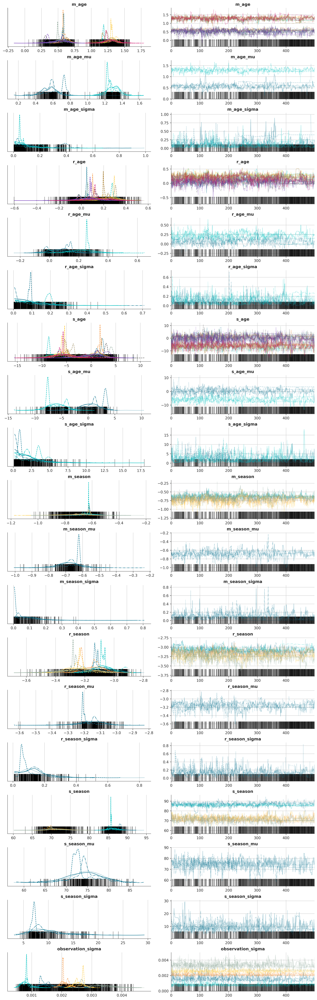

In [14]:
az.plot_trace(
    vaxflux_idata,
    var_names=[
        "m_age",
        "m_age_mu",
        "m_age_sigma",
        "r_age",
        "r_age_mu",
        "r_age_sigma",
        "s_age",
        "s_age_mu",
        "s_age_sigma",
        "m_season",
        "m_season_mu",
        "m_season_sigma",
        "r_season",
        "r_season_mu",
        "r_season_sigma",
        "s_season",
        "s_season_mu",
        "s_season_sigma",
        "observation_sigma",
    ],
)
plt.show()

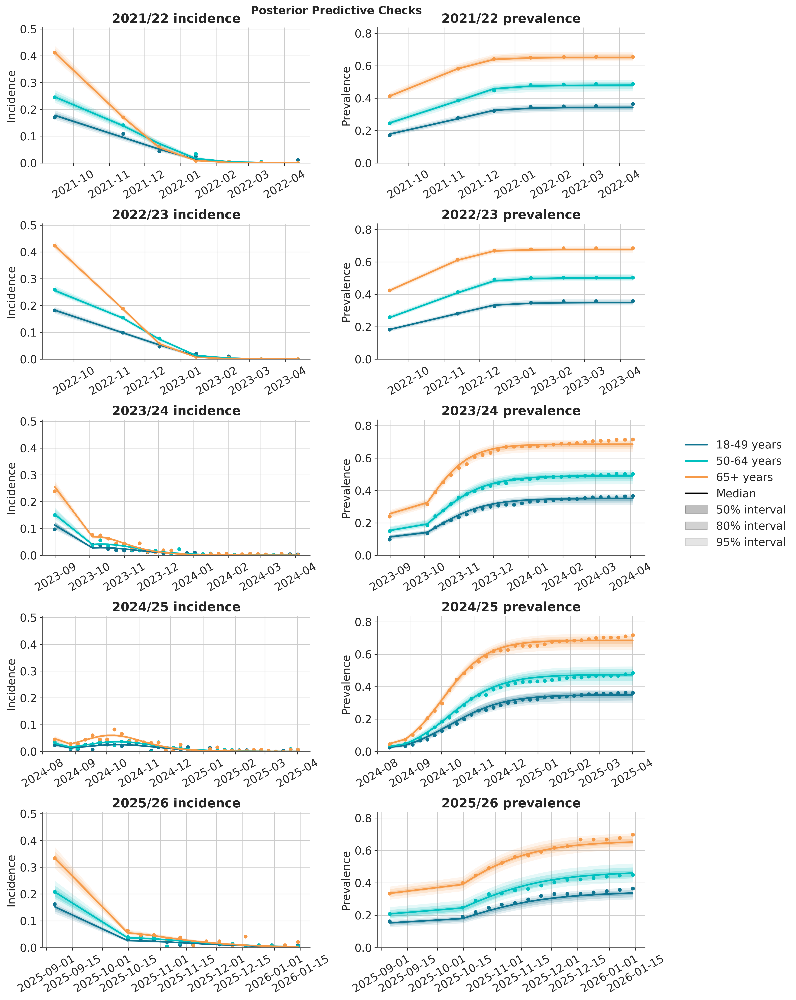

In [15]:
vaxflux_idata.plot_posterior_predictive()
plt.show()

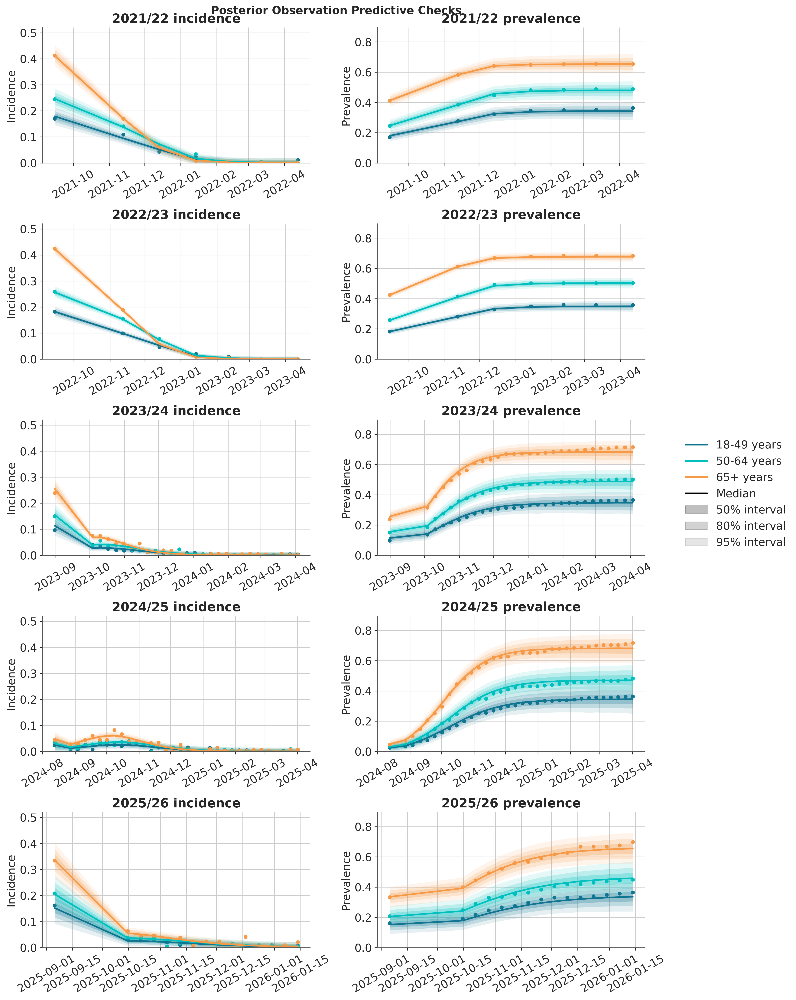

In [16]:
vaxflux_idata.plot_posterior_predictive(predictive="observation")
plt.show()

In [17]:
vaxflux_idata.posterior_prevalence_scenarios(
    scenarios={"low": (0.05, 0.3), "typical": (0.3, 0.7), "high": (0.7, 0.95)}
)

,season,age,scenario,low_quantile,high_quantile,low_prevalence,high_prevalence
0,2021/22,18-49 years,low,0.05,0.30,0.320420,0.336177
1,2021/22,50-64 years,low,0.05,0.30,0.449317,0.471521
2,2021/22,65+ years,low,0.05,0.30,0.631097,0.643995
3,2022/23,18-49 years,low,0.05,0.30,0.333942,0.344590
4,2022/23,50-64 years,low,0.05,0.30,0.486026,0.493459
5,2022/23,65+ years,low,0.05,0.30,0.661631,0.671975
6,2023/24,18-49 years,low,0.05,0.30,0.318892,0.340679
7,2023/24,50-64 years,low,0.05,0.30,0.447544,0.476956
8,2023/24,65+ years,low,0.05,0.30,0.646578,0.672906
9,2024/25,18-49 years,low,0.05,0.30,0.307271,0.334923
